# Simulation | [0,-27] Synchrotron

In [1]:
import joblib
import timeit

def savedata( name, obj ):
    tic=timeit.default_timer()
    with open( name,'wb' ) as Gv:
        joblib.dump( obj, Gv)
    toc=timeit.default_timer()
    print(toc - tic)
    
def loaddata( name ):
    tic=timeit.default_timer()
    with open( name,'rb' ) as Gv:
        mydata = joblib.load( Gv)
    toc=timeit.default_timer()
    print(toc - tic)
    return mydata

def load_Gfree_fitmap():
    Gfree_FoV2_fitmap = loaddata('Gfree_FoV2_fitmap.db')
    Gfree_FoV4_fitmap = loaddata('Gfree_FoV4_fitmap.db')
    return Gfree_FoV4_fitmap, Gfree_FoV2_fitmap
    
def load_Gsync_fitmap():
    Gsync_FoV2_fitmap = loaddata('Gsync_FoV2_fitmap.db')
    Gsync_FoV4_fitmap = loaddata('Gsync_FoV4_fitmap.db')
    return Gsync_FoV4_fitmap, Gsync_FoV2_fitmap

def load_Gfree_simmap():
    Fov4patch_map = loaddata('Gfree_FoV4_simmap.db')
    Fov4patch_gss = loaddata('Gfree_FoV4_simgss.db')
    Fov2patch_map = loaddata('Gfree_FoV2_simmap.db')
    Fov2patch_gss = loaddata('Gfree_FoV2_simgss.db')
    return Fov4patch_map, Fov4patch_gss, Fov2patch_map, Fov2patch_gss

def load_Gsync_simmap():
    Fov4patch_map = loaddata('Gsync_FoV4_simmap.db')
    Fov4patch_gss = loaddata('Gsync_FoV4_simgss.db')
    Fov2patch_map = loaddata('Gsync_FoV2_simmap.db')
    Fov2patch_gss = loaddata('Gsync_FoV2_simgss.db')
    return Fov4patch_map, Fov4patch_gss, Fov2patch_map, Fov2patch_gss

In [2]:
import pickle
from MCMC import MCMC
%matplotlib inline
from GalacticDev import GalacticDev

In [3]:
from GalacticCore import *
from astropy.io import fits

### Load maps

In [4]:
SF4_map, SF4_gss, SF2_map, SF2_gss = load_Gsync_simmap()

0.49598093144595623
0.4786951523274183
0.12213613092899323
0.12240709736943245


In [5]:
SF4_fitmap, SF2_fitmap = load_Gsync_fitmap()

0.02085963636636734
0.07448550499975681


#### Set-up gss-map

In [6]:
fov2grf = {}
fov2grf['fit'] = whiten(SF2_fitmap['gss'])
fov2grf['sim'] = whiten(SF2_gss)

In [7]:
fov4grf = {}
fov4grf['fit'] = whiten(SF4_fitmap['gss'])
fov4grf['sim'] = whiten(SF4_gss)

### FoV2x2

In [8]:
Sfov2 = GalacticDev( comp='Gsync', nside=32768, use_G02=True, extra_large_mode=True, grfmap=fov2grf, grfpatch=True, fov = ( 2, 2 ), sim_pixel = 2, default=True )

2022-08-13 13:24:48,283 : createlog : INFO : Log Header >> Action Time : Fuction or method: level : Message
2022-08-13 13:24:48,284 : createlog : INFO : Log standard output streaming is False
2022-08-13 13:24:48,286 : createlog : INFO : GSim_Gsync_Default_True_08_13_2022_132448.log log file is created
2022-08-13 13:24:48,286 : createlog : INFO : Log is created by cxshan
2022-08-13 13:24:48,287 : createlog : INFO : Log level is debug
2022-08-13 13:24:48,288 : __init__ : INFO :  ⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇ 
2022-08-13 13:24:48,290 : __init__ : INFO :  Galactic Gsync simulation is initializing! 
2022-08-13 13:24:48,291 : __init__ : WARNING :  sigma_tem default unit is [arcmin]! 
2022-08-13 13:24:48,292 : _set_comp : INFO : compID is galactic/synchrotron, name is Galactic synchrotron (unpolarized)
2022-08-13 13:24:48,293 : _set_default_io : INFO : Default IO is set. Output dir is /home/cxshan/data/fg21sim+/GalacticSimData/, clobber is True.
2022-08-13 13:24:48,293 : _set_default_params : INFO :  

 Please update the healpix maps when you need to. 


In [9]:
Sfov2.set_gamma(-2.2198359)

2022-08-13 13:24:48,773 : set_gamma : INFO :  gamma is set as -2.2198359 


In [10]:
Sfov2.set_alpha(0.0342225044016289)
Sfov2.set_beta(0.2268036829295495)

2022-08-13 13:24:48,794 : set_alpha : INFO :  alpha is set as 0.0342225044016289 
2022-08-13 13:24:48,795 : set_beta : INFO :  beta is set as 0.2268036829295495 


#### Set up frequency simulation

In [11]:
Sfov2._set_up_freq()

2022-08-13 13:25:15,426 : gen_simmap : INFO :  Finish generating the original image for simulation, using 26.603839134797454 s.
2022-08-13 13:25:15,429 : gen_simmap : INFO : Input patch flag detected. Using user input GRF patch for simulation.
2022-08-13 13:25:41,290 : gen_simmap : INFO :  Finish generating the spectral index patch image for simulation, using 25.61344923824072 s.
2022-08-13 13:25:41,293 : _set_physical_params : INFO :  Physical params are set. 


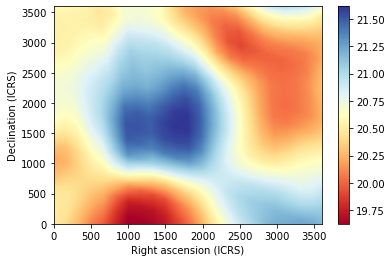

In [12]:
Sfov2.viewslice(Sfov2.patch_map)

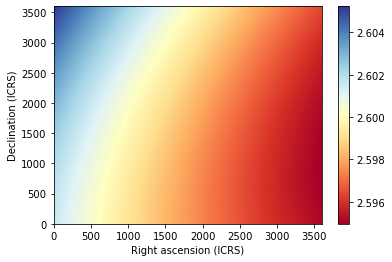

In [13]:
Sfov2.viewslice(Sfov2.patch_id)

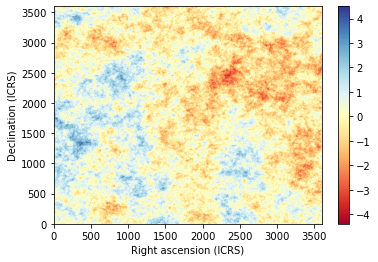

In [14]:
Sfov2.viewslice(Sfov2.patch_gss)

In [15]:
smoothed_input_map = Sfov2.smooth_sky(0.4, Sfov2.skypatch)

2022-08-13 13:25:45,517 : smooth_sky : INFO : Smoothing the <Ut.sky.SkyPatch object at 0x7ffb7b2a4550> with a Gaussian filter ...
2022-08-13 13:27:03,509 : smooth_sky : INFO : Smoothed sky patch using Gaussian filter of sigma = 672.00 [pixel]


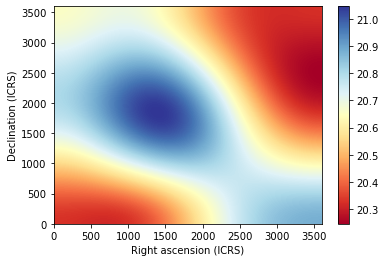

In [16]:
Sfov2.viewslice(smoothed_input_map)

In [17]:
Sfov2.skypatch.data = smoothed_input_map

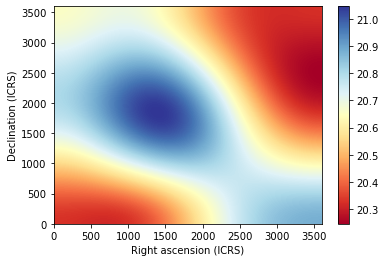

In [18]:
Sfov2.viewslice(Sfov2.skypatch.data)

In [19]:
Sfov2.filename_pattern = '{prefix}_fov2_0-27_{frequency:06.2f}.fits'

In [20]:
Sfov2.filename_pattern

'{prefix}_fov2_0-27_{frequency:06.2f}.fits'

### Simulate one freq

In [21]:
F158 = Sfov2.simulate_frequency(158,skytype='patch')

2022-08-13 13:27:06,403 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 158.00 [MHz] ...
2022-08-13 13:27:07,482 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:27:08,682 : simulate_frequency : INFO : Done simulate map at 158.00 [MHz].


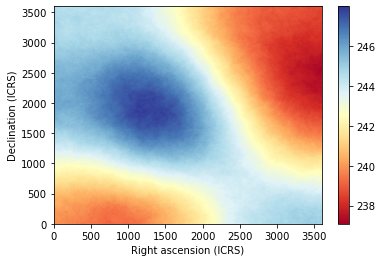

In [22]:
Sfov2.viewslice(F158.data)

### Simulate full freq bands

In [23]:
def do_simulation( freqlist, T, outdir ):
    T.output_dir = outdir
    for i in freqlist:
        sky = T.simulate(i, skytype='patch', smooth=False)
        print(sky)
        hdu = fits.open(sky[0])
        T.viewslice(hdu[0].data)

In [24]:
fov2_outhig = '/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196'
fov2_outmid = '/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162'
fov2_outlow = '/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128'

##### Low band

2022-08-13 13:27:10,158 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:27:10,160 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 120.00 [MHz] ...
2022-08-13 13:27:11,232 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:27:12,435 : simulate_frequency : INFO : Done simulate map at 120.00 [MHz].
2022-08-13 13:27:12,980 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_120.00.fits']


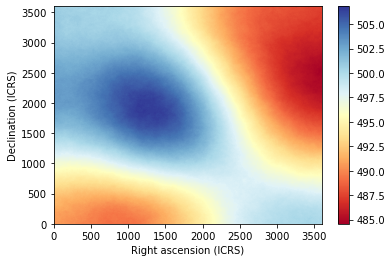

2022-08-13 13:27:14,261 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:27:14,263 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 120.16 [MHz] ...
2022-08-13 13:27:15,334 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:27:16,537 : simulate_frequency : INFO : Done simulate map at 120.16 [MHz].
2022-08-13 13:27:16,648 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_120.16.fits']


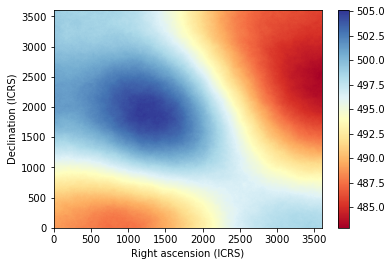

2022-08-13 13:27:17,932 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:27:17,934 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 120.32 [MHz] ...
2022-08-13 13:27:19,008 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:27:20,209 : simulate_frequency : INFO : Done simulate map at 120.32 [MHz].
2022-08-13 13:27:20,318 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_120.32.fits']


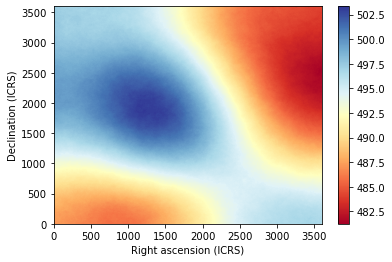

2022-08-13 13:27:21,602 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:27:21,604 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 120.48 [MHz] ...
2022-08-13 13:27:22,677 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:27:23,876 : simulate_frequency : INFO : Done simulate map at 120.48 [MHz].
2022-08-13 13:27:23,987 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_120.48.fits']


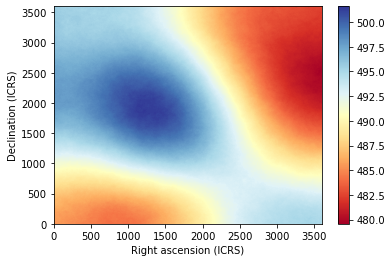

2022-08-13 13:27:25,267 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:27:25,270 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 120.64 [MHz] ...
2022-08-13 13:27:26,342 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:27:27,547 : simulate_frequency : INFO : Done simulate map at 120.64 [MHz].
2022-08-13 13:27:27,655 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_120.64.fits']


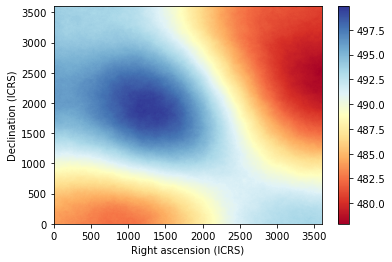

2022-08-13 13:27:28,929 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:27:28,932 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 120.80 [MHz] ...
2022-08-13 13:27:30,004 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:27:31,207 : simulate_frequency : INFO : Done simulate map at 120.80 [MHz].
2022-08-13 13:27:31,316 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_120.80.fits']


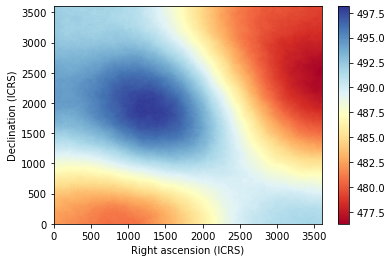

2022-08-13 13:27:32,598 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:27:32,601 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 120.96 [MHz] ...
2022-08-13 13:27:33,674 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:27:34,875 : simulate_frequency : INFO : Done simulate map at 120.96 [MHz].
2022-08-13 13:27:34,978 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_120.96.fits']


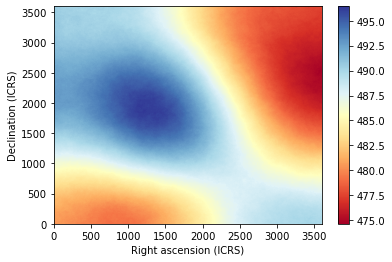

2022-08-13 13:27:36,257 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:27:36,259 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 121.12 [MHz] ...
2022-08-13 13:27:37,329 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:27:38,531 : simulate_frequency : INFO : Done simulate map at 121.12 [MHz].
2022-08-13 13:27:38,634 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_121.12.fits']


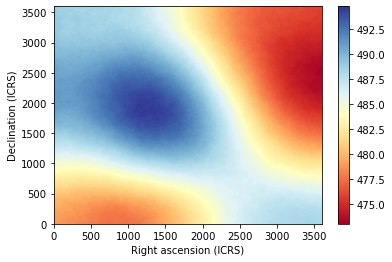

2022-08-13 13:27:39,914 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:27:39,916 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 121.28 [MHz] ...
2022-08-13 13:27:40,987 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:27:42,192 : simulate_frequency : INFO : Done simulate map at 121.28 [MHz].
2022-08-13 13:27:42,287 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_121.28.fits']


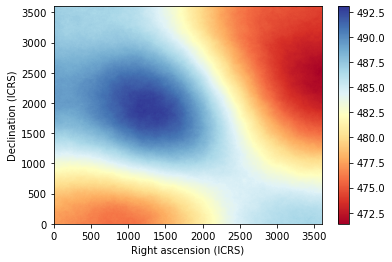

2022-08-13 13:27:43,566 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:27:43,569 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 121.44 [MHz] ...
2022-08-13 13:27:44,639 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:27:45,843 : simulate_frequency : INFO : Done simulate map at 121.44 [MHz].
2022-08-13 13:27:45,960 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_121.44.fits']


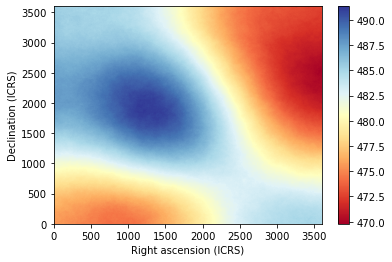

2022-08-13 13:27:47,239 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:27:47,241 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 121.60 [MHz] ...
2022-08-13 13:27:48,316 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:27:49,520 : simulate_frequency : INFO : Done simulate map at 121.60 [MHz].
2022-08-13 13:27:49,650 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_121.60.fits']


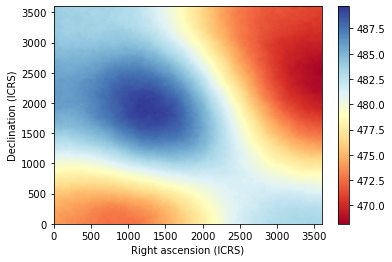

2022-08-13 13:27:50,923 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:27:50,925 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 121.76 [MHz] ...
2022-08-13 13:27:52,000 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:27:53,202 : simulate_frequency : INFO : Done simulate map at 121.76 [MHz].
2022-08-13 13:27:53,314 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_121.76.fits']


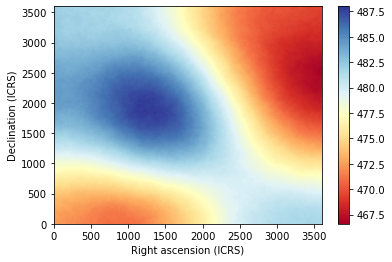

2022-08-13 13:27:55,031 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:27:55,034 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 121.92 [MHz] ...
2022-08-13 13:27:56,104 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:27:57,304 : simulate_frequency : INFO : Done simulate map at 121.92 [MHz].
2022-08-13 13:27:57,412 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_121.92.fits']


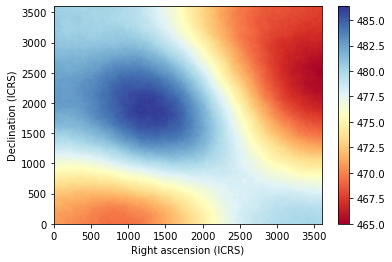

2022-08-13 13:27:58,692 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:27:58,694 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 122.08 [MHz] ...
2022-08-13 13:27:59,769 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:28:00,970 : simulate_frequency : INFO : Done simulate map at 122.08 [MHz].
2022-08-13 13:28:01,099 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_122.08.fits']


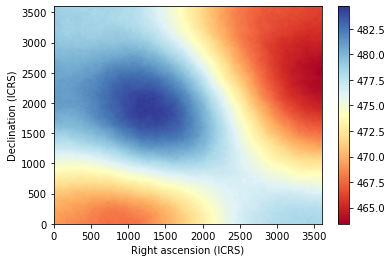

2022-08-13 13:28:02,375 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:28:02,378 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 122.24 [MHz] ...
2022-08-13 13:28:03,451 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:28:04,649 : simulate_frequency : INFO : Done simulate map at 122.24 [MHz].
2022-08-13 13:28:04,771 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_122.24.fits']


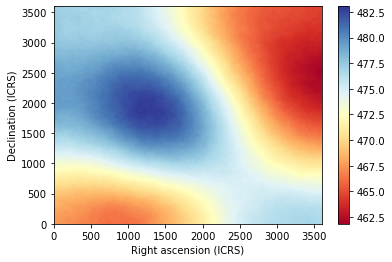

2022-08-13 13:28:06,050 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:28:06,052 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 122.40 [MHz] ...
2022-08-13 13:28:07,126 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:28:08,329 : simulate_frequency : INFO : Done simulate map at 122.40 [MHz].
2022-08-13 13:28:08,452 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_122.40.fits']


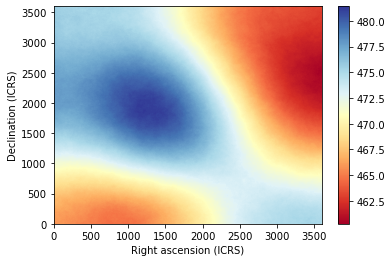

2022-08-13 13:28:09,727 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:28:09,729 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 122.56 [MHz] ...
2022-08-13 13:28:10,802 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:28:12,005 : simulate_frequency : INFO : Done simulate map at 122.56 [MHz].
2022-08-13 13:28:12,138 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_122.56.fits']


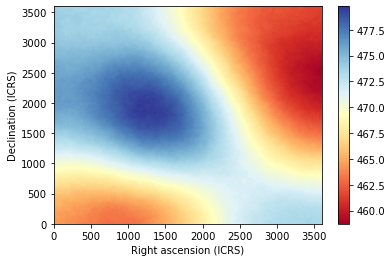

2022-08-13 13:28:13,411 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:28:13,413 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 122.72 [MHz] ...
2022-08-13 13:28:14,486 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:28:15,688 : simulate_frequency : INFO : Done simulate map at 122.72 [MHz].
2022-08-13 13:28:15,821 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_122.72.fits']


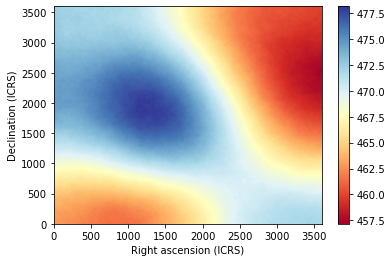

2022-08-13 13:28:17,099 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:28:17,101 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 122.88 [MHz] ...
2022-08-13 13:28:18,177 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:28:19,378 : simulate_frequency : INFO : Done simulate map at 122.88 [MHz].
2022-08-13 13:28:19,507 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_122.88.fits']


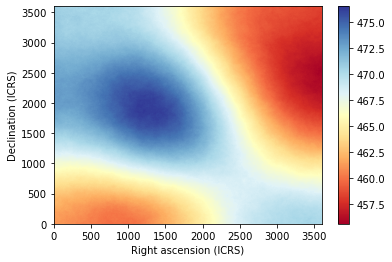

2022-08-13 13:28:20,786 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:28:20,789 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 123.04 [MHz] ...
2022-08-13 13:28:21,864 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:28:23,067 : simulate_frequency : INFO : Done simulate map at 123.04 [MHz].
2022-08-13 13:28:23,194 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_123.04.fits']


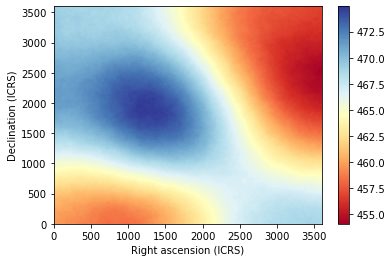

2022-08-13 13:28:24,467 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:28:24,469 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 123.20 [MHz] ...
2022-08-13 13:28:25,543 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:28:26,749 : simulate_frequency : INFO : Done simulate map at 123.20 [MHz].
2022-08-13 13:28:26,853 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_123.20.fits']


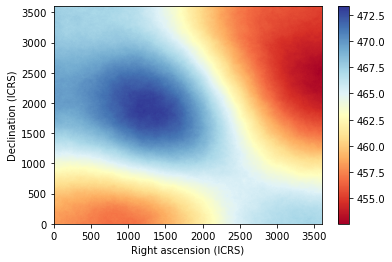

2022-08-13 13:28:28,125 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:28:28,128 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 123.36 [MHz] ...
2022-08-13 13:28:29,198 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:28:30,397 : simulate_frequency : INFO : Done simulate map at 123.36 [MHz].
2022-08-13 13:28:30,486 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_123.36.fits']


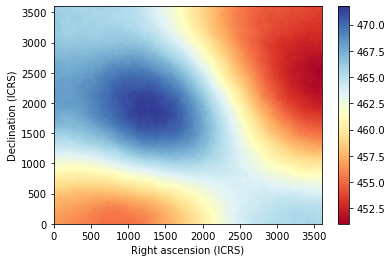

2022-08-13 13:28:31,758 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:28:31,760 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 123.52 [MHz] ...
2022-08-13 13:28:32,830 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:28:34,030 : simulate_frequency : INFO : Done simulate map at 123.52 [MHz].
2022-08-13 13:28:34,120 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_123.52.fits']


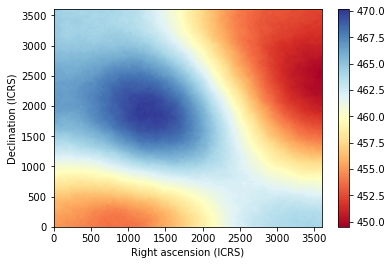

2022-08-13 13:28:35,835 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:28:35,837 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 123.68 [MHz] ...
2022-08-13 13:28:36,907 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:28:38,107 : simulate_frequency : INFO : Done simulate map at 123.68 [MHz].
2022-08-13 13:28:38,196 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_123.68.fits']


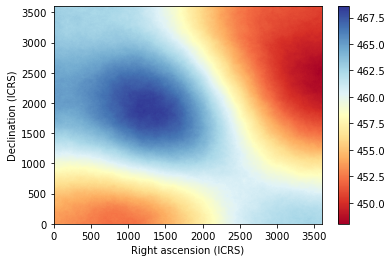

2022-08-13 13:28:39,471 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:28:39,473 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 123.84 [MHz] ...
2022-08-13 13:28:40,546 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:28:41,746 : simulate_frequency : INFO : Done simulate map at 123.84 [MHz].
2022-08-13 13:28:41,834 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_123.84.fits']


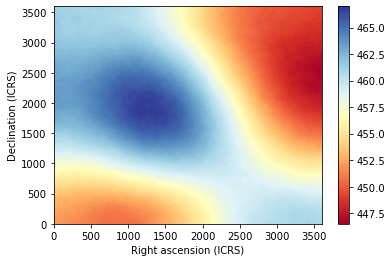

2022-08-13 13:28:43,110 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:28:43,112 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 124.00 [MHz] ...
2022-08-13 13:28:44,188 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:28:45,386 : simulate_frequency : INFO : Done simulate map at 124.00 [MHz].
2022-08-13 13:28:45,475 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_124.00.fits']


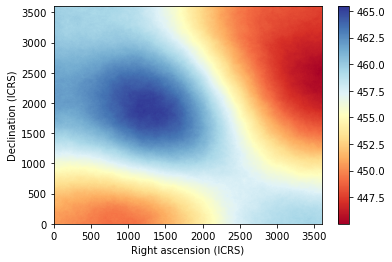

2022-08-13 13:28:46,750 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:28:46,752 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 124.16 [MHz] ...
2022-08-13 13:28:47,824 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:28:49,025 : simulate_frequency : INFO : Done simulate map at 124.16 [MHz].
2022-08-13 13:28:49,116 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_124.16.fits']


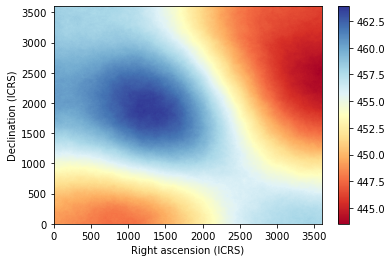

2022-08-13 13:28:50,390 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:28:50,392 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 124.32 [MHz] ...
2022-08-13 13:28:51,463 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:28:52,663 : simulate_frequency : INFO : Done simulate map at 124.32 [MHz].
2022-08-13 13:28:52,752 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_124.32.fits']


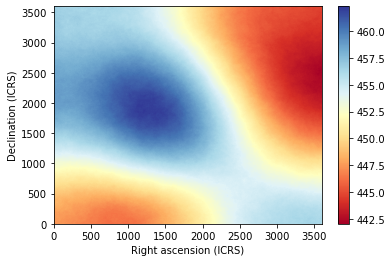

2022-08-13 13:28:54,024 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:28:54,026 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 124.48 [MHz] ...
2022-08-13 13:28:55,096 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:28:56,295 : simulate_frequency : INFO : Done simulate map at 124.48 [MHz].
2022-08-13 13:28:56,384 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_124.48.fits']


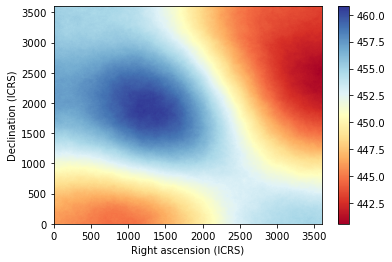

2022-08-13 13:28:57,656 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:28:57,658 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 124.64 [MHz] ...
2022-08-13 13:28:58,730 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:28:59,928 : simulate_frequency : INFO : Done simulate map at 124.64 [MHz].
2022-08-13 13:29:00,015 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_124.64.fits']


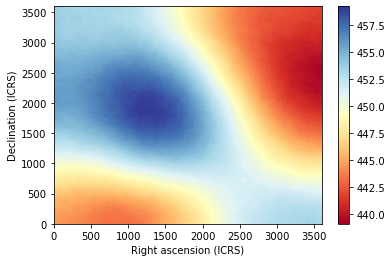

2022-08-13 13:29:01,288 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:29:01,290 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 124.80 [MHz] ...
2022-08-13 13:29:02,360 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:29:03,556 : simulate_frequency : INFO : Done simulate map at 124.80 [MHz].
2022-08-13 13:29:03,645 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_124.80.fits']


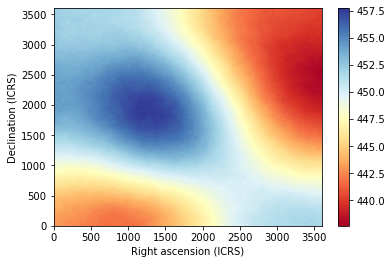

2022-08-13 13:29:04,917 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:29:04,919 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 124.96 [MHz] ...
2022-08-13 13:29:05,989 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:29:07,186 : simulate_frequency : INFO : Done simulate map at 124.96 [MHz].
2022-08-13 13:29:07,274 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_124.96.fits']


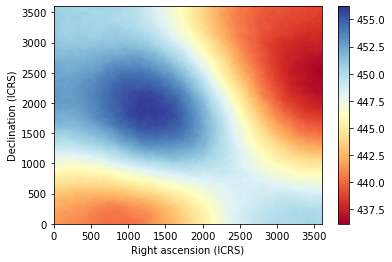

2022-08-13 13:29:08,545 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:29:08,548 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 125.12 [MHz] ...
2022-08-13 13:29:09,617 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:29:10,813 : simulate_frequency : INFO : Done simulate map at 125.12 [MHz].
2022-08-13 13:29:10,901 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_125.12.fits']


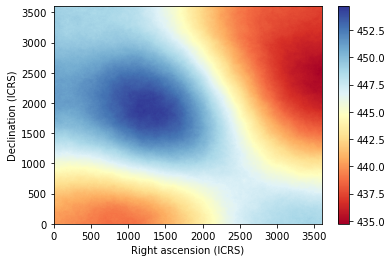

2022-08-13 13:29:12,172 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:29:12,174 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 125.28 [MHz] ...
2022-08-13 13:29:13,244 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:29:14,441 : simulate_frequency : INFO : Done simulate map at 125.28 [MHz].
2022-08-13 13:29:14,528 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_125.28.fits']


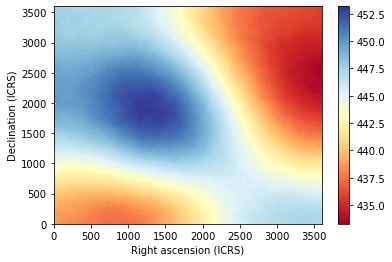

2022-08-13 13:29:16,238 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:29:16,240 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 125.44 [MHz] ...
2022-08-13 13:29:17,310 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:29:18,507 : simulate_frequency : INFO : Done simulate map at 125.44 [MHz].
2022-08-13 13:29:18,597 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_125.44.fits']


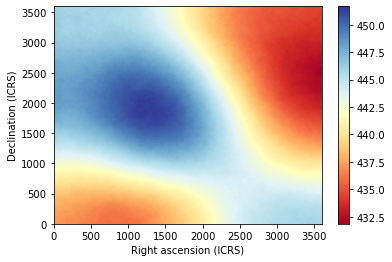

2022-08-13 13:29:19,872 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:29:19,874 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 125.60 [MHz] ...
2022-08-13 13:29:20,946 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:29:22,143 : simulate_frequency : INFO : Done simulate map at 125.60 [MHz].
2022-08-13 13:29:22,233 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_125.60.fits']


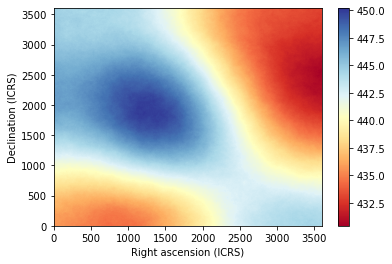

2022-08-13 13:29:23,508 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:29:23,510 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 125.76 [MHz] ...
2022-08-13 13:29:24,581 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:29:25,778 : simulate_frequency : INFO : Done simulate map at 125.76 [MHz].
2022-08-13 13:29:25,866 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_125.76.fits']


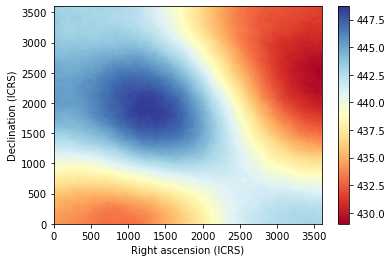

2022-08-13 13:29:27,141 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:29:27,143 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 125.92 [MHz] ...
2022-08-13 13:29:28,214 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:29:29,413 : simulate_frequency : INFO : Done simulate map at 125.92 [MHz].
2022-08-13 13:29:29,502 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_125.92.fits']


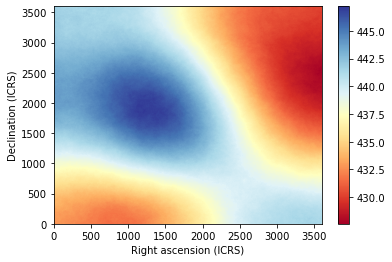

2022-08-13 13:29:30,772 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:29:30,774 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 126.08 [MHz] ...
2022-08-13 13:29:31,844 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:29:33,043 : simulate_frequency : INFO : Done simulate map at 126.08 [MHz].
2022-08-13 13:29:33,131 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_126.08.fits']


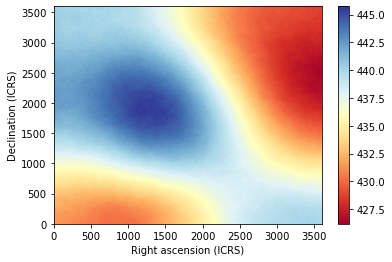

2022-08-13 13:29:34,404 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:29:34,406 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 126.24 [MHz] ...
2022-08-13 13:29:35,476 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:29:36,675 : simulate_frequency : INFO : Done simulate map at 126.24 [MHz].
2022-08-13 13:29:36,763 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_126.24.fits']


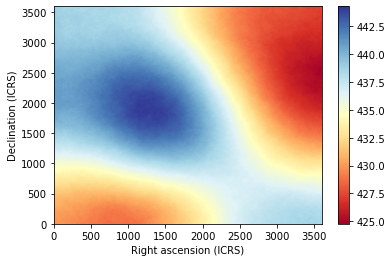

2022-08-13 13:29:38,034 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:29:38,037 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 126.40 [MHz] ...
2022-08-13 13:29:39,107 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:29:40,305 : simulate_frequency : INFO : Done simulate map at 126.40 [MHz].
2022-08-13 13:29:40,393 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_126.40.fits']


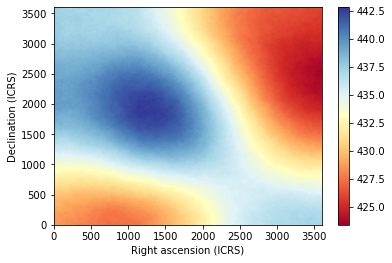

2022-08-13 13:29:41,668 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:29:41,670 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 126.56 [MHz] ...
2022-08-13 13:29:42,739 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:29:43,939 : simulate_frequency : INFO : Done simulate map at 126.56 [MHz].
2022-08-13 13:29:44,026 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_126.56.fits']


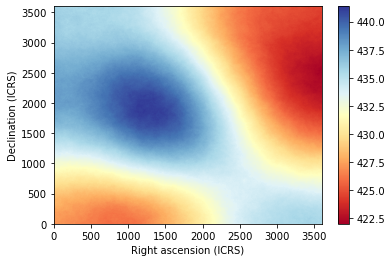

2022-08-13 13:29:45,300 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:29:45,302 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 126.72 [MHz] ...
2022-08-13 13:29:46,373 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:29:47,571 : simulate_frequency : INFO : Done simulate map at 126.72 [MHz].
2022-08-13 13:29:47,658 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_126.72.fits']


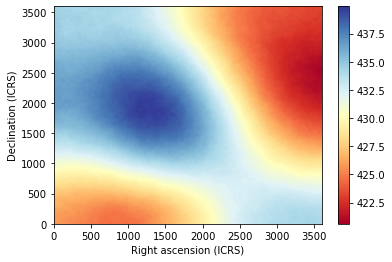

2022-08-13 13:29:48,927 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:29:48,930 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 126.88 [MHz] ...
2022-08-13 13:29:49,999 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:29:51,199 : simulate_frequency : INFO : Done simulate map at 126.88 [MHz].
2022-08-13 13:29:51,287 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_126.88.fits']


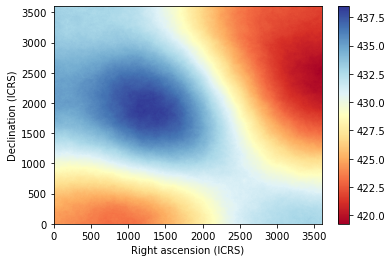

2022-08-13 13:29:52,558 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:29:52,560 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 127.04 [MHz] ...
2022-08-13 13:29:53,630 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:29:54,831 : simulate_frequency : INFO : Done simulate map at 127.04 [MHz].
2022-08-13 13:29:54,918 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_127.04.fits']


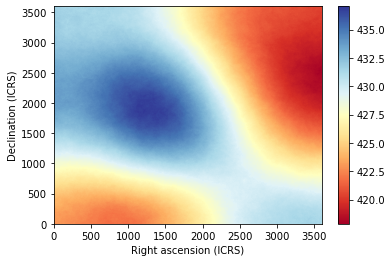

2022-08-13 13:29:56,624 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:29:56,627 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 127.20 [MHz] ...
2022-08-13 13:29:57,696 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:29:58,894 : simulate_frequency : INFO : Done simulate map at 127.20 [MHz].
2022-08-13 13:29:58,981 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_127.20.fits']


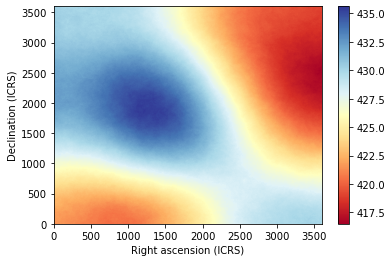

2022-08-13 13:30:00,256 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:30:00,259 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 127.36 [MHz] ...
2022-08-13 13:30:01,330 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:30:02,527 : simulate_frequency : INFO : Done simulate map at 127.36 [MHz].
2022-08-13 13:30:02,615 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_127.36.fits']


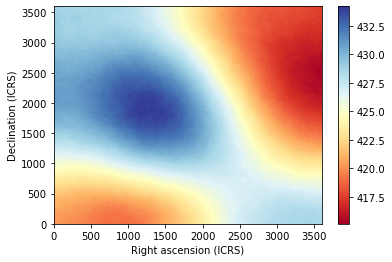

2022-08-13 13:30:03,885 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:30:03,888 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 127.52 [MHz] ...
2022-08-13 13:30:05,061 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:30:06,259 : simulate_frequency : INFO : Done simulate map at 127.52 [MHz].
2022-08-13 13:30:06,346 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_127.52.fits']


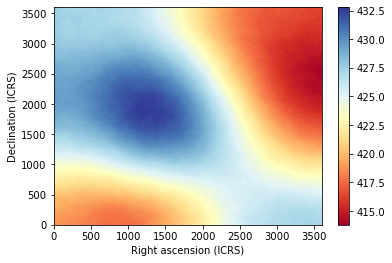

2022-08-13 13:30:07,621 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:30:07,624 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 127.68 [MHz] ...
2022-08-13 13:30:08,695 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:30:09,894 : simulate_frequency : INFO : Done simulate map at 127.68 [MHz].
2022-08-13 13:30:09,981 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_127.68.fits']


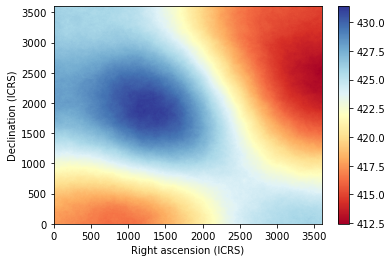

2022-08-13 13:30:11,254 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:30:11,256 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 127.84 [MHz] ...
2022-08-13 13:30:12,326 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:30:13,524 : simulate_frequency : INFO : Done simulate map at 127.84 [MHz].
2022-08-13 13:30:13,612 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_127.84.fits']


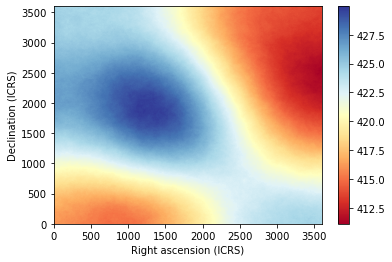

2022-08-13 13:30:14,881 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:30:14,883 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 128.00 [MHz] ...
2022-08-13 13:30:15,953 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:30:17,151 : simulate_frequency : INFO : Done simulate map at 128.00 [MHz].
2022-08-13 13:30:17,239 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128/gsync_fov2_0-27_128.00.fits']


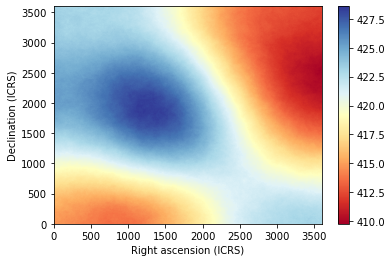

In [25]:
do_simulation(Sfov2.freqs['low']['f'], Sfov2, fov2_outlow)

##### Mid band

2022-08-13 13:30:18,523 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:30:18,526 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 154.00 [MHz] ...
2022-08-13 13:30:19,602 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:30:20,801 : simulate_frequency : INFO : Done simulate map at 154.00 [MHz].
2022-08-13 13:30:20,888 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_154.00.fits']


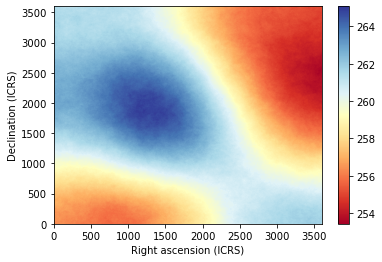

2022-08-13 13:30:22,151 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:30:22,154 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 154.16 [MHz] ...
2022-08-13 13:30:23,230 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:30:24,430 : simulate_frequency : INFO : Done simulate map at 154.16 [MHz].
2022-08-13 13:30:24,517 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_154.16.fits']


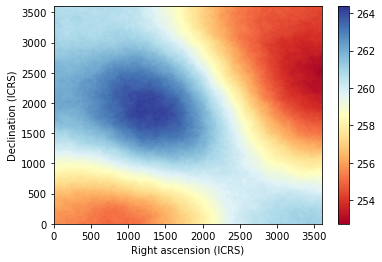

2022-08-13 13:30:25,780 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:30:25,783 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 154.32 [MHz] ...
2022-08-13 13:30:26,860 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:30:28,060 : simulate_frequency : INFO : Done simulate map at 154.32 [MHz].
2022-08-13 13:30:28,148 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_154.32.fits']


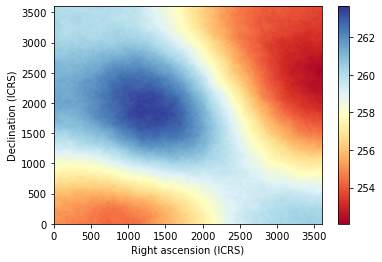

2022-08-13 13:30:29,408 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:30:29,410 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 154.48 [MHz] ...
2022-08-13 13:30:30,485 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:30:31,684 : simulate_frequency : INFO : Done simulate map at 154.48 [MHz].
2022-08-13 13:30:31,825 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_154.48.fits']


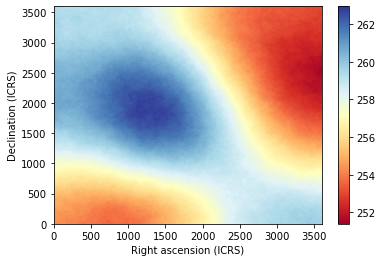

2022-08-13 13:30:33,088 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:30:33,090 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 154.64 [MHz] ...
2022-08-13 13:30:34,166 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:30:35,367 : simulate_frequency : INFO : Done simulate map at 154.64 [MHz].
2022-08-13 13:30:35,454 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_154.64.fits']


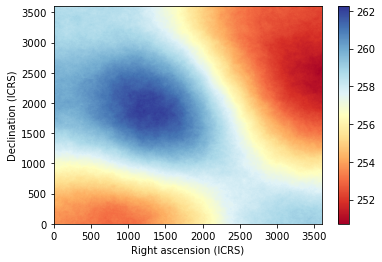

2022-08-13 13:30:37,156 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:30:37,159 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 154.80 [MHz] ...
2022-08-13 13:30:38,234 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:30:39,435 : simulate_frequency : INFO : Done simulate map at 154.80 [MHz].
2022-08-13 13:30:39,524 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_154.80.fits']


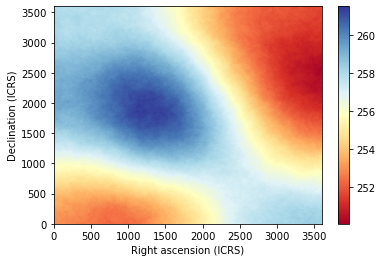

2022-08-13 13:30:40,787 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:30:40,789 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 154.96 [MHz] ...
2022-08-13 13:30:41,866 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:30:43,067 : simulate_frequency : INFO : Done simulate map at 154.96 [MHz].
2022-08-13 13:30:43,154 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_154.96.fits']


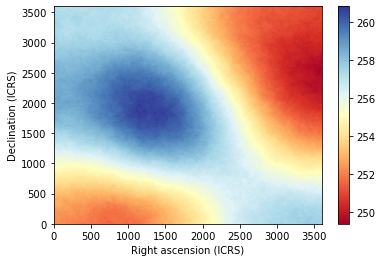

2022-08-13 13:30:44,423 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:30:44,426 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 155.12 [MHz] ...
2022-08-13 13:30:45,503 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:30:46,702 : simulate_frequency : INFO : Done simulate map at 155.12 [MHz].
2022-08-13 13:30:46,790 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_155.12.fits']


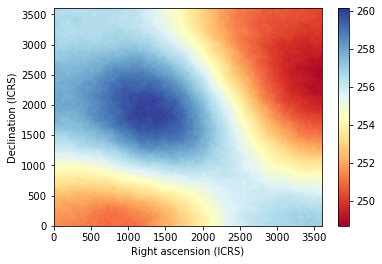

2022-08-13 13:30:48,057 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:30:48,060 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 155.28 [MHz] ...
2022-08-13 13:30:49,136 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:30:50,337 : simulate_frequency : INFO : Done simulate map at 155.28 [MHz].
2022-08-13 13:30:50,424 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_155.28.fits']


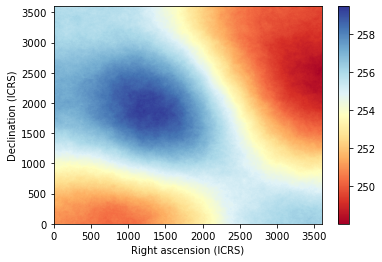

2022-08-13 13:30:51,685 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:30:51,688 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 155.44 [MHz] ...
2022-08-13 13:30:52,764 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:30:53,964 : simulate_frequency : INFO : Done simulate map at 155.44 [MHz].
2022-08-13 13:30:54,052 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_155.44.fits']


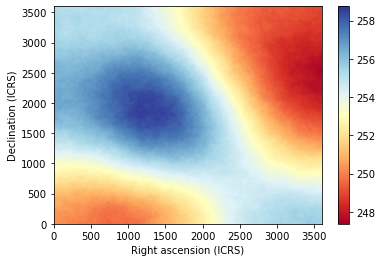

2022-08-13 13:30:55,318 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:30:55,320 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 155.60 [MHz] ...
2022-08-13 13:30:56,397 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:30:57,594 : simulate_frequency : INFO : Done simulate map at 155.60 [MHz].
2022-08-13 13:30:57,682 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_155.60.fits']


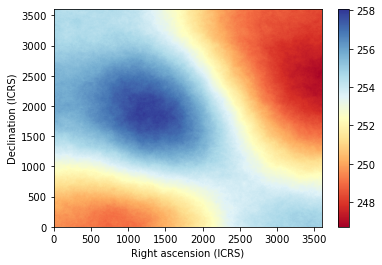

2022-08-13 13:30:58,946 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:30:58,948 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 155.76 [MHz] ...
2022-08-13 13:31:00,025 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:31:01,224 : simulate_frequency : INFO : Done simulate map at 155.76 [MHz].
2022-08-13 13:31:01,311 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_155.76.fits']


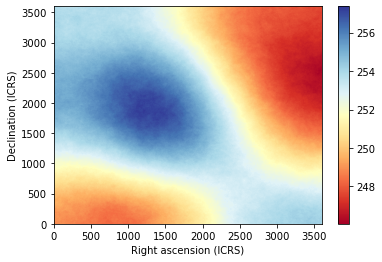

2022-08-13 13:31:02,572 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:31:02,574 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 155.92 [MHz] ...
2022-08-13 13:31:03,650 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:31:04,850 : simulate_frequency : INFO : Done simulate map at 155.92 [MHz].
2022-08-13 13:31:04,938 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_155.92.fits']


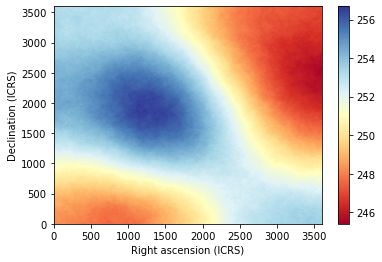

2022-08-13 13:31:06,202 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:31:06,204 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 156.08 [MHz] ...
2022-08-13 13:31:07,280 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:31:08,480 : simulate_frequency : INFO : Done simulate map at 156.08 [MHz].
2022-08-13 13:31:08,567 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_156.08.fits']


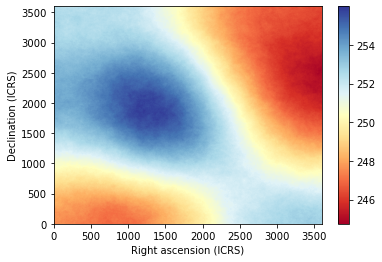

2022-08-13 13:31:09,828 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:31:09,830 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 156.24 [MHz] ...
2022-08-13 13:31:10,906 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:31:12,103 : simulate_frequency : INFO : Done simulate map at 156.24 [MHz].
2022-08-13 13:31:12,190 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_156.24.fits']


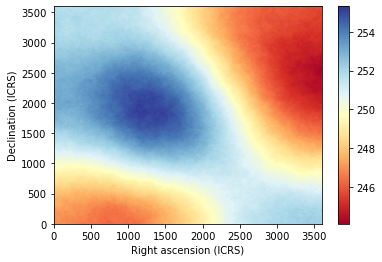

2022-08-13 13:31:13,450 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:31:13,453 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 156.40 [MHz] ...
2022-08-13 13:31:14,530 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:31:15,730 : simulate_frequency : INFO : Done simulate map at 156.40 [MHz].
2022-08-13 13:31:15,817 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_156.40.fits']


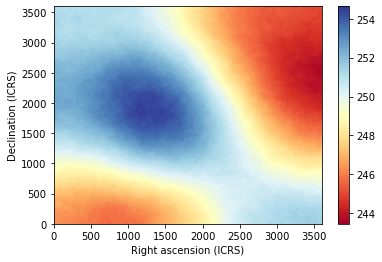

2022-08-13 13:31:17,518 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:31:17,520 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 156.56 [MHz] ...
2022-08-13 13:31:18,596 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:31:19,794 : simulate_frequency : INFO : Done simulate map at 156.56 [MHz].
2022-08-13 13:31:19,882 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_156.56.fits']


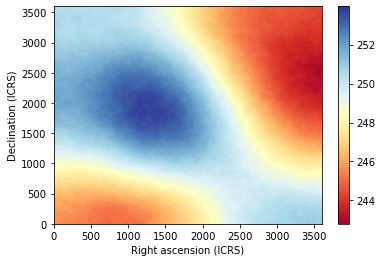

2022-08-13 13:31:21,146 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:31:21,148 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 156.72 [MHz] ...
2022-08-13 13:31:22,226 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:31:23,425 : simulate_frequency : INFO : Done simulate map at 156.72 [MHz].
2022-08-13 13:31:23,513 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_156.72.fits']


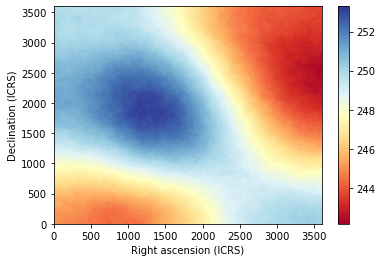

2022-08-13 13:31:24,777 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:31:24,779 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 156.88 [MHz] ...
2022-08-13 13:31:25,857 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:31:27,055 : simulate_frequency : INFO : Done simulate map at 156.88 [MHz].
2022-08-13 13:31:27,142 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_156.88.fits']


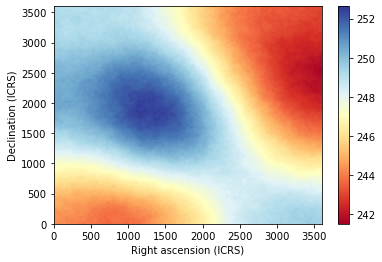

2022-08-13 13:31:28,410 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:31:28,412 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 157.04 [MHz] ...
2022-08-13 13:31:29,490 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:31:30,690 : simulate_frequency : INFO : Done simulate map at 157.04 [MHz].
2022-08-13 13:31:30,778 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_157.04.fits']


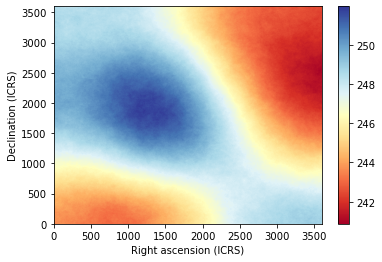

2022-08-13 13:31:32,040 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:31:32,042 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 157.20 [MHz] ...
2022-08-13 13:31:33,119 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:31:34,320 : simulate_frequency : INFO : Done simulate map at 157.20 [MHz].
2022-08-13 13:31:34,408 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_157.20.fits']


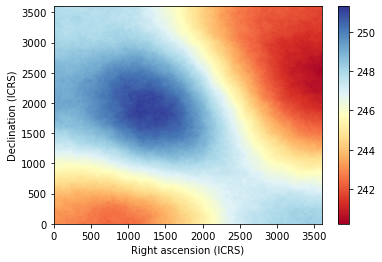

2022-08-13 13:31:35,669 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:31:35,672 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 157.36 [MHz] ...
2022-08-13 13:31:36,749 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:31:37,949 : simulate_frequency : INFO : Done simulate map at 157.36 [MHz].
2022-08-13 13:31:38,036 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_157.36.fits']


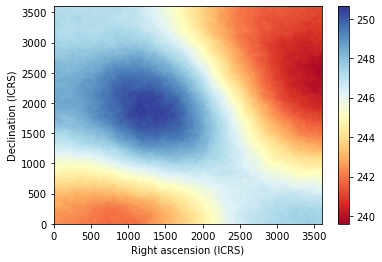

2022-08-13 13:31:39,300 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:31:39,303 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 157.52 [MHz] ...
2022-08-13 13:31:40,379 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:31:41,577 : simulate_frequency : INFO : Done simulate map at 157.52 [MHz].
2022-08-13 13:31:41,679 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_157.52.fits']


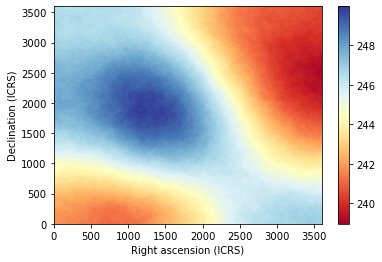

2022-08-13 13:31:42,944 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:31:42,946 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 157.68 [MHz] ...
2022-08-13 13:31:44,022 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:31:45,221 : simulate_frequency : INFO : Done simulate map at 157.68 [MHz].
2022-08-13 13:31:45,310 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_157.68.fits']


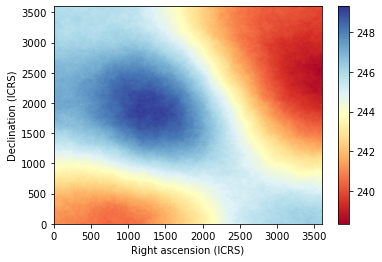

2022-08-13 13:31:46,570 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:31:46,573 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 157.84 [MHz] ...
2022-08-13 13:31:47,650 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:31:48,851 : simulate_frequency : INFO : Done simulate map at 157.84 [MHz].
2022-08-13 13:31:48,938 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_157.84.fits']


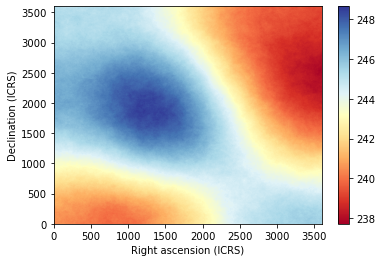

2022-08-13 13:31:50,203 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:31:50,206 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 158.00 [MHz] ...
2022-08-13 13:31:51,282 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:31:52,481 : simulate_frequency : INFO : Done simulate map at 158.00 [MHz].
2022-08-13 13:31:52,582 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_158.00.fits']


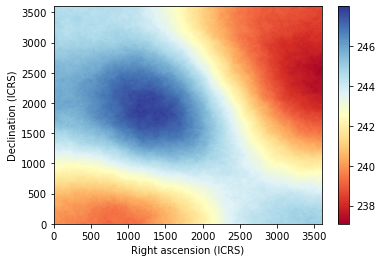

2022-08-13 13:31:53,843 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:31:53,845 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 158.16 [MHz] ...
2022-08-13 13:31:54,921 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:31:56,123 : simulate_frequency : INFO : Done simulate map at 158.16 [MHz].
2022-08-13 13:31:56,211 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_158.16.fits']


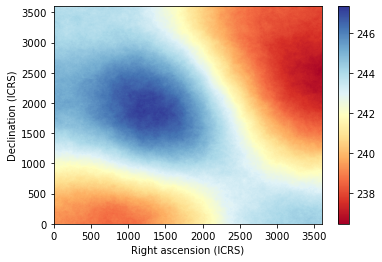

2022-08-13 13:31:57,911 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:31:57,913 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 158.32 [MHz] ...
2022-08-13 13:31:58,989 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:32:00,189 : simulate_frequency : INFO : Done simulate map at 158.32 [MHz].
2022-08-13 13:32:00,277 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_158.32.fits']


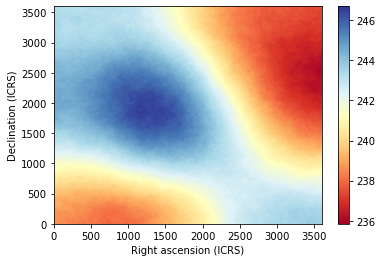

2022-08-13 13:32:01,546 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:32:01,548 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 158.48 [MHz] ...
2022-08-13 13:32:02,626 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:32:03,827 : simulate_frequency : INFO : Done simulate map at 158.48 [MHz].
2022-08-13 13:32:03,972 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_158.48.fits']


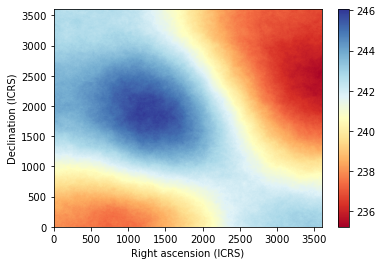

2022-08-13 13:32:05,242 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:32:05,244 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 158.64 [MHz] ...
2022-08-13 13:32:06,321 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:32:07,519 : simulate_frequency : INFO : Done simulate map at 158.64 [MHz].
2022-08-13 13:32:07,607 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_158.64.fits']


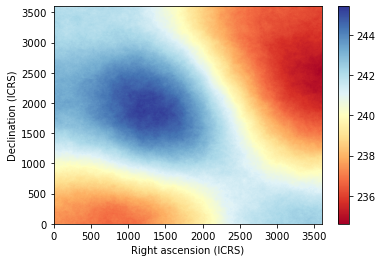

2022-08-13 13:32:08,869 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:32:08,871 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 158.80 [MHz] ...
2022-08-13 13:32:09,948 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:32:11,147 : simulate_frequency : INFO : Done simulate map at 158.80 [MHz].
2022-08-13 13:32:11,247 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_158.80.fits']


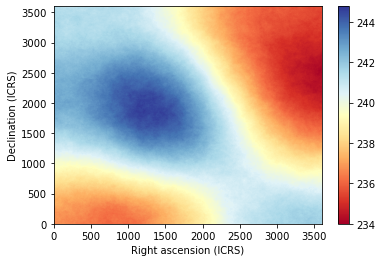

2022-08-13 13:32:12,512 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:32:12,514 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 158.96 [MHz] ...
2022-08-13 13:32:13,591 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:32:14,790 : simulate_frequency : INFO : Done simulate map at 158.96 [MHz].
2022-08-13 13:32:14,878 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_158.96.fits']


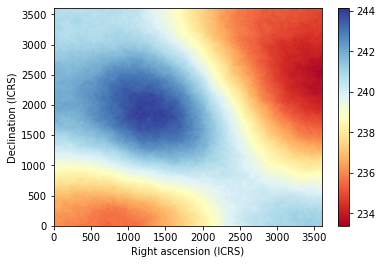

2022-08-13 13:32:16,141 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:32:16,143 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 159.12 [MHz] ...
2022-08-13 13:32:17,220 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:32:18,419 : simulate_frequency : INFO : Done simulate map at 159.12 [MHz].
2022-08-13 13:32:18,564 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_159.12.fits']


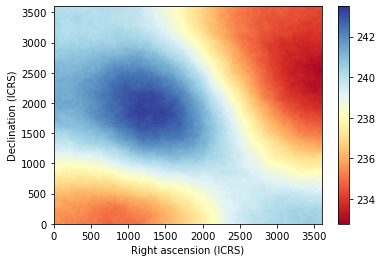

2022-08-13 13:32:19,825 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:32:19,827 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 159.28 [MHz] ...
2022-08-13 13:32:20,903 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:32:22,101 : simulate_frequency : INFO : Done simulate map at 159.28 [MHz].
2022-08-13 13:32:22,189 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_159.28.fits']


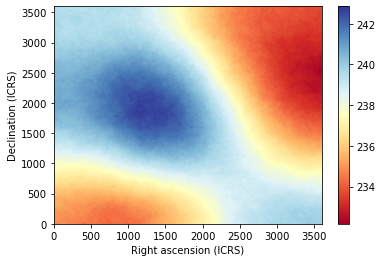

2022-08-13 13:32:23,451 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:32:23,454 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 159.44 [MHz] ...
2022-08-13 13:32:24,529 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:32:25,790 : simulate_frequency : INFO : Done simulate map at 159.44 [MHz].
2022-08-13 13:32:25,878 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_159.44.fits']


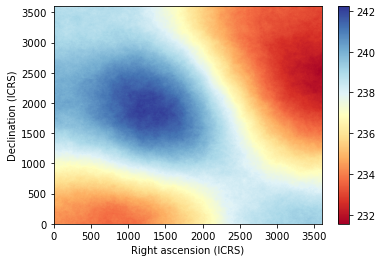

2022-08-13 13:32:27,143 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:32:27,146 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 159.60 [MHz] ...
2022-08-13 13:32:28,223 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:32:29,528 : simulate_frequency : INFO : Done simulate map at 159.60 [MHz].
2022-08-13 13:32:29,615 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_159.60.fits']


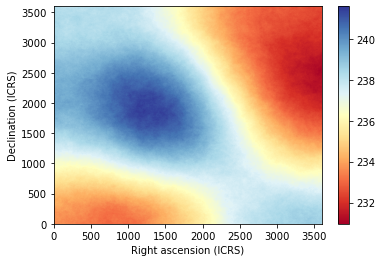

2022-08-13 13:32:30,874 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:32:30,877 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 159.76 [MHz] ...
2022-08-13 13:32:31,953 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:32:33,254 : simulate_frequency : INFO : Done simulate map at 159.76 [MHz].
2022-08-13 13:32:33,342 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_159.76.fits']


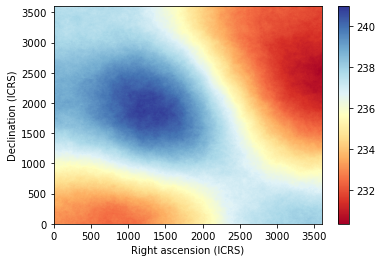

2022-08-13 13:32:34,601 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:32:34,603 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 159.92 [MHz] ...
2022-08-13 13:32:35,680 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:32:36,984 : simulate_frequency : INFO : Done simulate map at 159.92 [MHz].
2022-08-13 13:32:37,071 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_159.92.fits']


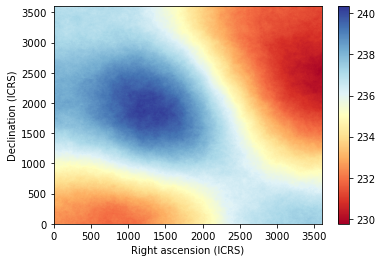

2022-08-13 13:32:38,770 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:32:38,772 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 160.08 [MHz] ...
2022-08-13 13:32:39,848 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:32:41,047 : simulate_frequency : INFO : Done simulate map at 160.08 [MHz].
2022-08-13 13:32:41,136 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_160.08.fits']


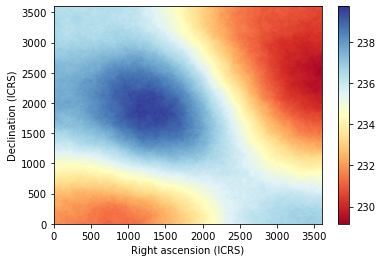

2022-08-13 13:32:42,397 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:32:42,399 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 160.24 [MHz] ...
2022-08-13 13:32:43,478 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:32:44,678 : simulate_frequency : INFO : Done simulate map at 160.24 [MHz].
2022-08-13 13:32:44,767 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_160.24.fits']


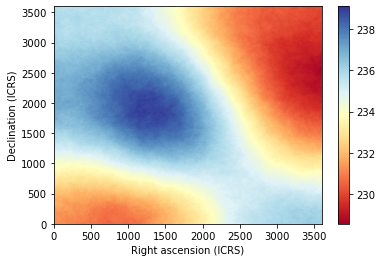

2022-08-13 13:32:46,033 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:32:46,036 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 160.40 [MHz] ...
2022-08-13 13:32:47,112 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:32:48,308 : simulate_frequency : INFO : Done simulate map at 160.40 [MHz].
2022-08-13 13:32:48,395 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_160.40.fits']


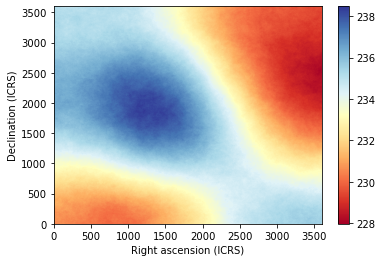

2022-08-13 13:32:49,660 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:32:49,662 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 160.56 [MHz] ...
2022-08-13 13:32:50,739 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:32:51,937 : simulate_frequency : INFO : Done simulate map at 160.56 [MHz].
2022-08-13 13:32:52,024 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_160.56.fits']


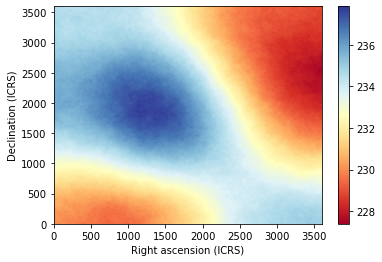

2022-08-13 13:32:53,284 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:32:53,286 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 160.72 [MHz] ...
2022-08-13 13:32:54,363 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:32:55,562 : simulate_frequency : INFO : Done simulate map at 160.72 [MHz].
2022-08-13 13:32:55,649 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_160.72.fits']


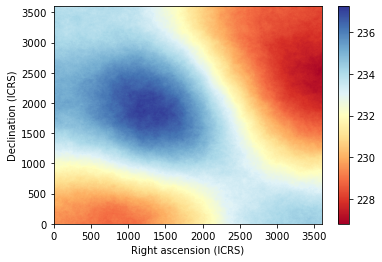

2022-08-13 13:32:56,908 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:32:56,910 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 160.88 [MHz] ...
2022-08-13 13:32:57,986 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:32:59,237 : simulate_frequency : INFO : Done simulate map at 160.88 [MHz].
2022-08-13 13:32:59,323 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_160.88.fits']


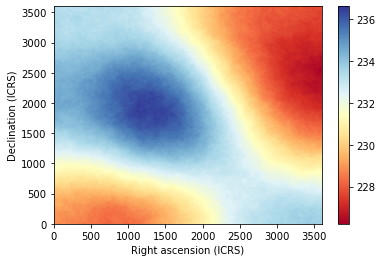

2022-08-13 13:33:00,581 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:33:00,583 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 161.04 [MHz] ...
2022-08-13 13:33:01,660 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:33:02,961 : simulate_frequency : INFO : Done simulate map at 161.04 [MHz].
2022-08-13 13:33:03,047 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_161.04.fits']


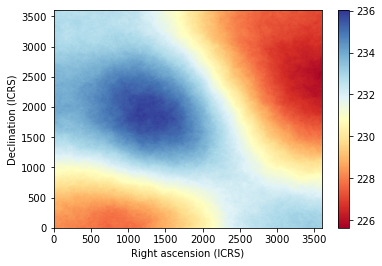

2022-08-13 13:33:04,310 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:33:04,312 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 161.20 [MHz] ...
2022-08-13 13:33:05,388 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:33:06,691 : simulate_frequency : INFO : Done simulate map at 161.20 [MHz].
2022-08-13 13:33:06,779 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_161.20.fits']


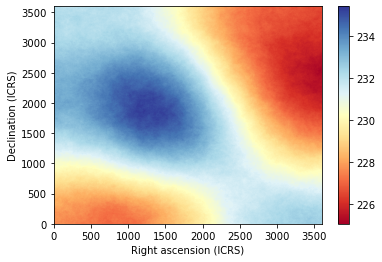

2022-08-13 13:33:08,038 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:33:08,039 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 161.36 [MHz] ...
2022-08-13 13:33:09,116 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:33:10,416 : simulate_frequency : INFO : Done simulate map at 161.36 [MHz].
2022-08-13 13:33:10,523 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_161.36.fits']


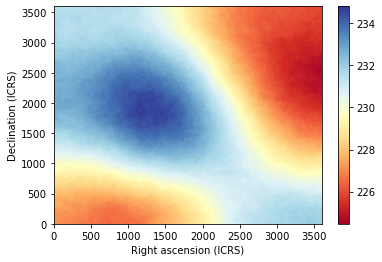

2022-08-13 13:33:11,780 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:33:11,782 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 161.52 [MHz] ...
2022-08-13 13:33:12,857 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:33:14,158 : simulate_frequency : INFO : Done simulate map at 161.52 [MHz].
2022-08-13 13:33:14,246 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_161.52.fits']


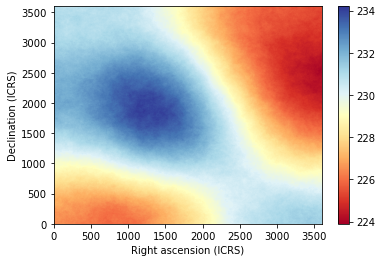

2022-08-13 13:33:15,508 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:33:15,510 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 161.68 [MHz] ...
2022-08-13 13:33:16,586 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:33:17,887 : simulate_frequency : INFO : Done simulate map at 161.68 [MHz].
2022-08-13 13:33:17,973 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_161.68.fits']


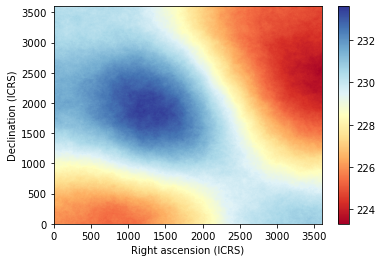

2022-08-13 13:33:19,666 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:33:19,668 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 161.84 [MHz] ...
2022-08-13 13:33:20,744 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:33:21,940 : simulate_frequency : INFO : Done simulate map at 161.84 [MHz].
2022-08-13 13:33:22,066 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_161.84.fits']


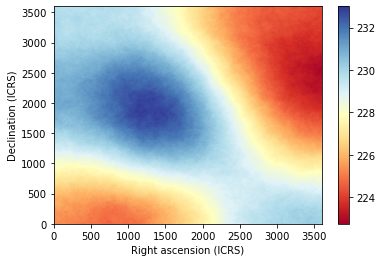

2022-08-13 13:33:23,326 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:33:23,328 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 162.00 [MHz] ...
2022-08-13 13:33:24,405 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:33:25,603 : simulate_frequency : INFO : Done simulate map at 162.00 [MHz].
2022-08-13 13:33:25,690 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162/gsync_fov2_0-27_162.00.fits']


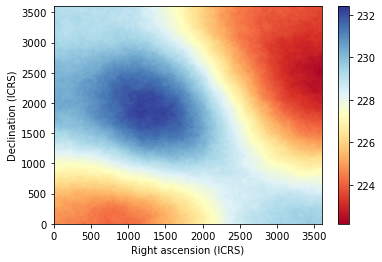

In [26]:
do_simulation(Sfov2.freqs['mid']['f'], Sfov2, fov2_outmid)

##### hig band

2022-08-13 13:33:26,965 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:33:26,968 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 188.00 [MHz] ...
2022-08-13 13:33:28,045 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:33:29,244 : simulate_frequency : INFO : Done simulate map at 188.00 [MHz].
2022-08-13 13:33:29,331 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_188.00.fits']


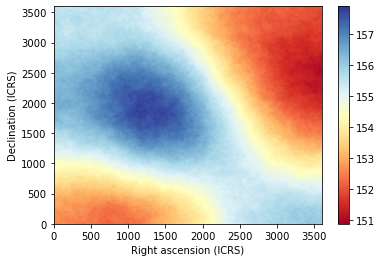

2022-08-13 13:33:30,601 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:33:30,602 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 188.16 [MHz] ...
2022-08-13 13:33:31,680 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:33:32,881 : simulate_frequency : INFO : Done simulate map at 188.16 [MHz].
2022-08-13 13:33:32,968 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_188.16.fits']


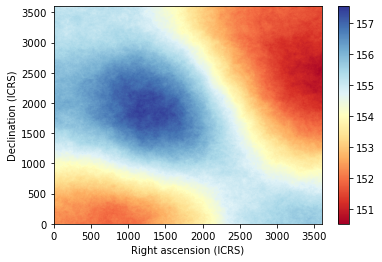

2022-08-13 13:33:34,237 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:33:34,239 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 188.32 [MHz] ...
2022-08-13 13:33:35,316 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:33:36,518 : simulate_frequency : INFO : Done simulate map at 188.32 [MHz].
2022-08-13 13:33:36,615 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_188.32.fits']


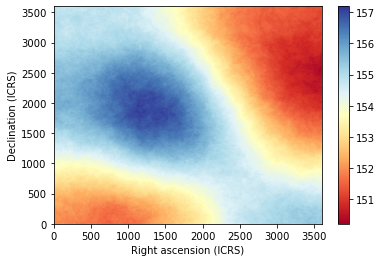

2022-08-13 13:33:37,885 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:33:37,886 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 188.48 [MHz] ...
2022-08-13 13:33:38,963 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:33:40,217 : simulate_frequency : INFO : Done simulate map at 188.48 [MHz].
2022-08-13 13:33:40,303 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_188.48.fits']


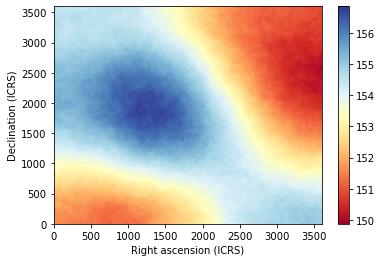

2022-08-13 13:33:41,572 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:33:41,574 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 188.64 [MHz] ...
2022-08-13 13:33:42,652 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:33:43,958 : simulate_frequency : INFO : Done simulate map at 188.64 [MHz].
2022-08-13 13:33:44,044 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_188.64.fits']


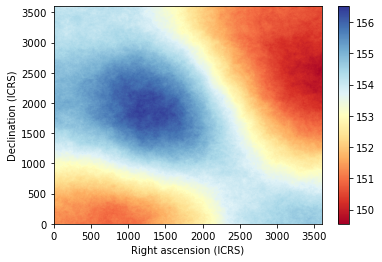

2022-08-13 13:33:45,314 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:33:45,316 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 188.80 [MHz] ...
2022-08-13 13:33:46,393 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:33:47,700 : simulate_frequency : INFO : Done simulate map at 188.80 [MHz].
2022-08-13 13:33:47,787 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_188.80.fits']


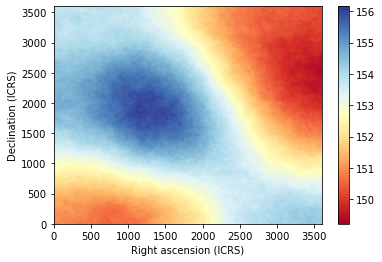

2022-08-13 13:33:49,057 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:33:49,059 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 188.96 [MHz] ...
2022-08-13 13:33:50,136 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:33:51,440 : simulate_frequency : INFO : Done simulate map at 188.96 [MHz].
2022-08-13 13:33:51,526 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_188.96.fits']


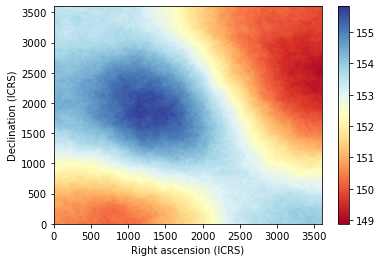

2022-08-13 13:33:52,794 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:33:52,796 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 189.12 [MHz] ...
2022-08-13 13:33:53,873 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:33:55,178 : simulate_frequency : INFO : Done simulate map at 189.12 [MHz].
2022-08-13 13:33:55,265 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_189.12.fits']


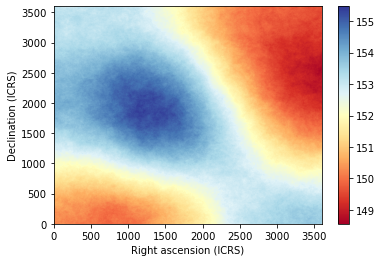

2022-08-13 13:33:56,534 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:33:56,536 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 189.28 [MHz] ...
2022-08-13 13:33:57,612 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:33:58,917 : simulate_frequency : INFO : Done simulate map at 189.28 [MHz].
2022-08-13 13:33:59,003 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_189.28.fits']


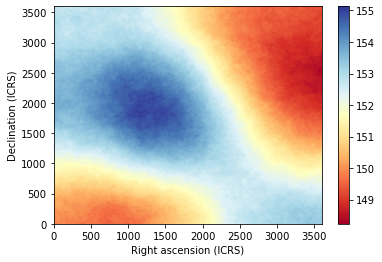

2022-08-13 13:34:00,710 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:34:00,712 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 189.44 [MHz] ...
2022-08-13 13:34:01,789 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:34:02,988 : simulate_frequency : INFO : Done simulate map at 189.44 [MHz].
2022-08-13 13:34:03,075 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_189.44.fits']


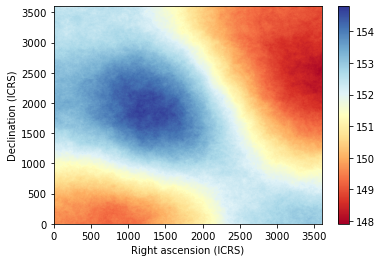

2022-08-13 13:34:04,348 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:34:04,350 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 189.60 [MHz] ...
2022-08-13 13:34:05,428 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:34:06,628 : simulate_frequency : INFO : Done simulate map at 189.60 [MHz].
2022-08-13 13:34:06,715 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_189.60.fits']


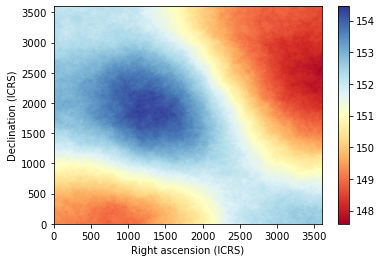

2022-08-13 13:34:07,988 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:34:07,990 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 189.76 [MHz] ...
2022-08-13 13:34:09,068 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:34:10,266 : simulate_frequency : INFO : Done simulate map at 189.76 [MHz].
2022-08-13 13:34:10,352 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_189.76.fits']


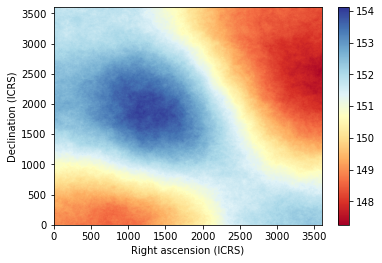

2022-08-13 13:34:11,623 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:34:11,624 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 189.92 [MHz] ...
2022-08-13 13:34:12,702 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:34:13,903 : simulate_frequency : INFO : Done simulate map at 189.92 [MHz].
2022-08-13 13:34:13,989 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_189.92.fits']


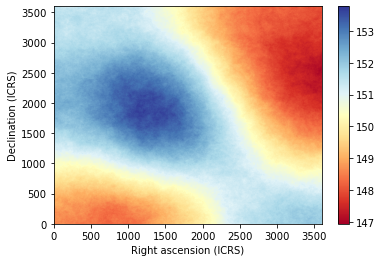

2022-08-13 13:34:15,260 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:34:15,262 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 190.08 [MHz] ...
2022-08-13 13:34:16,339 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:34:17,539 : simulate_frequency : INFO : Done simulate map at 190.08 [MHz].
2022-08-13 13:34:17,625 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_190.08.fits']


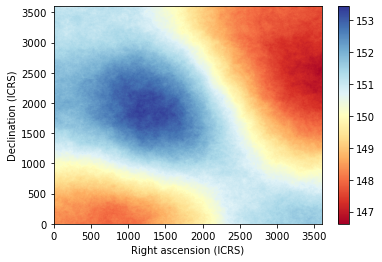

2022-08-13 13:34:18,894 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:34:18,896 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 190.24 [MHz] ...
2022-08-13 13:34:19,973 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:34:21,225 : simulate_frequency : INFO : Done simulate map at 190.24 [MHz].
2022-08-13 13:34:21,312 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_190.24.fits']


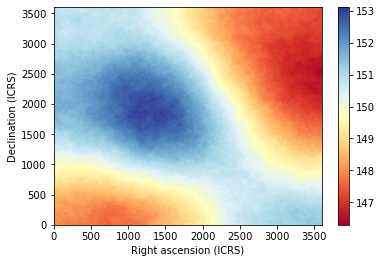

2022-08-13 13:34:22,581 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:34:22,583 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 190.40 [MHz] ...
2022-08-13 13:34:23,660 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:34:24,964 : simulate_frequency : INFO : Done simulate map at 190.40 [MHz].
2022-08-13 13:34:25,050 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_190.40.fits']


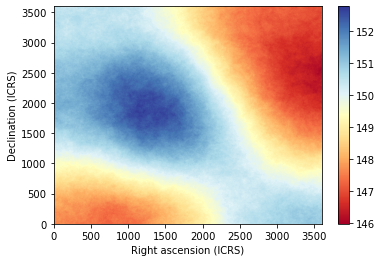

2022-08-13 13:34:26,322 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:34:26,323 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 190.56 [MHz] ...
2022-08-13 13:34:27,400 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:34:28,706 : simulate_frequency : INFO : Done simulate map at 190.56 [MHz].
2022-08-13 13:34:28,795 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_190.56.fits']


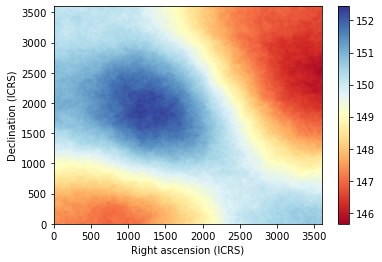

2022-08-13 13:34:30,064 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:34:30,066 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 190.72 [MHz] ...
2022-08-13 13:34:31,143 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:34:32,447 : simulate_frequency : INFO : Done simulate map at 190.72 [MHz].
2022-08-13 13:34:32,533 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_190.72.fits']


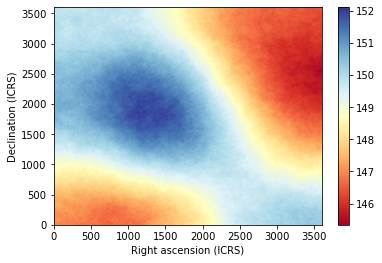

2022-08-13 13:34:33,802 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:34:33,805 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 190.88 [MHz] ...
2022-08-13 13:34:34,881 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:34:36,185 : simulate_frequency : INFO : Done simulate map at 190.88 [MHz].
2022-08-13 13:34:36,272 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_190.88.fits']


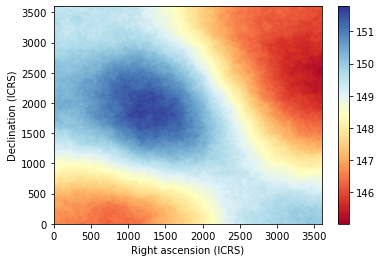

2022-08-13 13:34:37,537 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:34:37,539 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 191.04 [MHz] ...
2022-08-13 13:34:38,616 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:34:39,922 : simulate_frequency : INFO : Done simulate map at 191.04 [MHz].
2022-08-13 13:34:40,008 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_191.04.fits']


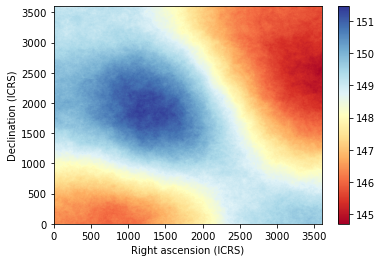

2022-08-13 13:34:41,719 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:34:41,721 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 191.20 [MHz] ...
2022-08-13 13:34:42,798 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:34:43,998 : simulate_frequency : INFO : Done simulate map at 191.20 [MHz].
2022-08-13 13:34:44,085 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_191.20.fits']


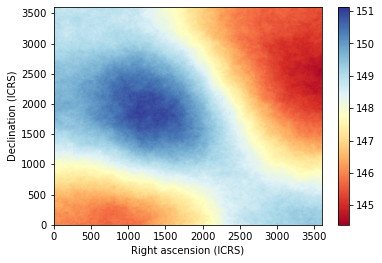

2022-08-13 13:34:45,358 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:34:45,360 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 191.36 [MHz] ...
2022-08-13 13:34:46,439 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:34:47,638 : simulate_frequency : INFO : Done simulate map at 191.36 [MHz].
2022-08-13 13:34:47,729 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_191.36.fits']


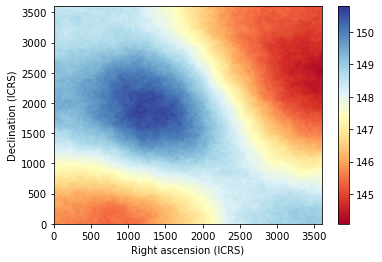

2022-08-13 13:34:48,998 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:34:49,000 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 191.52 [MHz] ...
2022-08-13 13:34:50,078 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:34:51,277 : simulate_frequency : INFO : Done simulate map at 191.52 [MHz].
2022-08-13 13:34:51,364 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_191.52.fits']


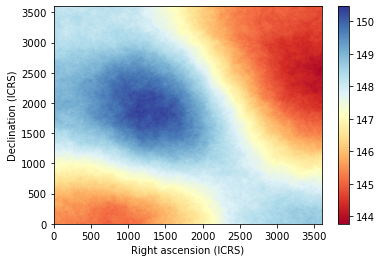

2022-08-13 13:34:52,638 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:34:52,639 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 191.68 [MHz] ...
2022-08-13 13:34:53,717 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:34:54,918 : simulate_frequency : INFO : Done simulate map at 191.68 [MHz].
2022-08-13 13:34:55,005 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_191.68.fits']


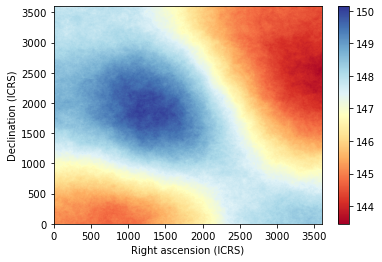

2022-08-13 13:34:56,274 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:34:56,276 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 191.84 [MHz] ...
2022-08-13 13:34:57,354 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:34:58,556 : simulate_frequency : INFO : Done simulate map at 191.84 [MHz].
2022-08-13 13:34:58,643 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_191.84.fits']


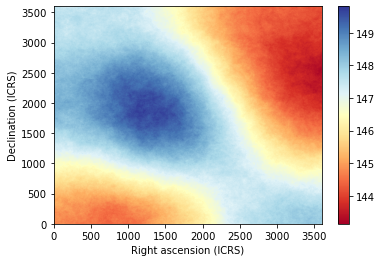

2022-08-13 13:34:59,909 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:34:59,911 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 192.00 [MHz] ...
2022-08-13 13:35:00,988 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:35:02,243 : simulate_frequency : INFO : Done simulate map at 192.00 [MHz].
2022-08-13 13:35:02,388 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_192.00.fits']


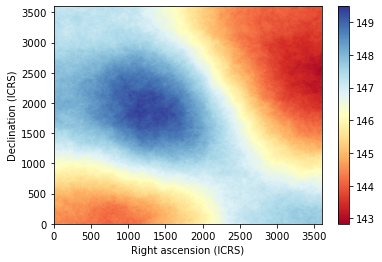

2022-08-13 13:35:03,658 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:35:03,659 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 192.16 [MHz] ...
2022-08-13 13:35:04,737 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:35:06,042 : simulate_frequency : INFO : Done simulate map at 192.16 [MHz].
2022-08-13 13:35:06,128 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_192.16.fits']


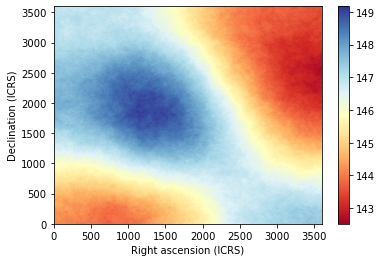

2022-08-13 13:35:07,400 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:35:07,402 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 192.32 [MHz] ...
2022-08-13 13:35:08,479 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:35:09,785 : simulate_frequency : INFO : Done simulate map at 192.32 [MHz].
2022-08-13 13:35:09,881 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_192.32.fits']


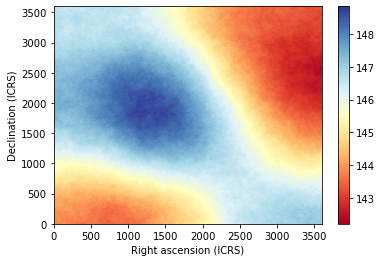

2022-08-13 13:35:11,147 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:35:11,149 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 192.48 [MHz] ...
2022-08-13 13:35:12,227 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:35:13,532 : simulate_frequency : INFO : Done simulate map at 192.48 [MHz].
2022-08-13 13:35:13,619 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_192.48.fits']


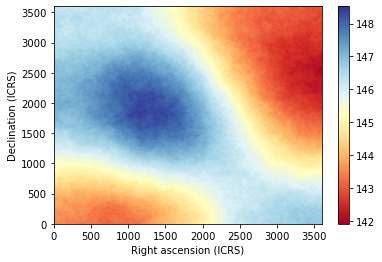

2022-08-13 13:35:14,890 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:35:14,892 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 192.64 [MHz] ...
2022-08-13 13:35:15,969 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:35:17,276 : simulate_frequency : INFO : Done simulate map at 192.64 [MHz].
2022-08-13 13:35:17,364 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_192.64.fits']


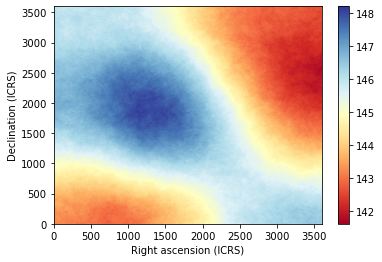

2022-08-13 13:35:18,635 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:35:18,637 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 192.80 [MHz] ...
2022-08-13 13:35:19,714 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:35:21,021 : simulate_frequency : INFO : Done simulate map at 192.80 [MHz].
2022-08-13 13:35:21,107 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_192.80.fits']


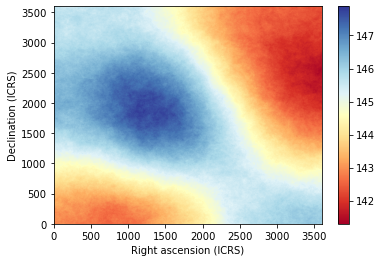

2022-08-13 13:35:22,813 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:35:22,814 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 192.96 [MHz] ...
2022-08-13 13:35:23,891 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:35:25,092 : simulate_frequency : INFO : Done simulate map at 192.96 [MHz].
2022-08-13 13:35:25,179 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_192.96.fits']


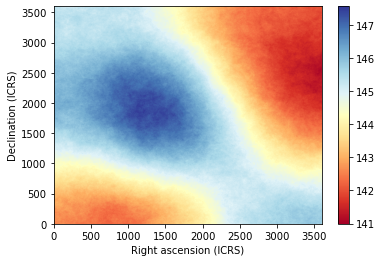

2022-08-13 13:35:26,452 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:35:26,453 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 193.12 [MHz] ...
2022-08-13 13:35:27,532 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:35:28,734 : simulate_frequency : INFO : Done simulate map at 193.12 [MHz].
2022-08-13 13:35:28,821 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_193.12.fits']


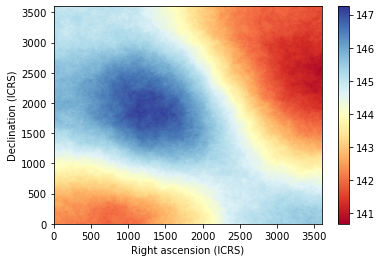

2022-08-13 13:35:30,097 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:35:30,099 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 193.28 [MHz] ...
2022-08-13 13:35:31,176 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:35:32,377 : simulate_frequency : INFO : Done simulate map at 193.28 [MHz].
2022-08-13 13:35:32,463 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_193.28.fits']


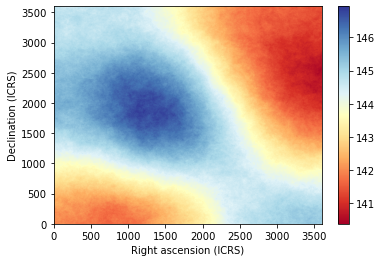

2022-08-13 13:35:33,732 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:35:33,734 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 193.44 [MHz] ...
2022-08-13 13:35:34,812 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:35:36,014 : simulate_frequency : INFO : Done simulate map at 193.44 [MHz].
2022-08-13 13:35:36,101 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_193.44.fits']


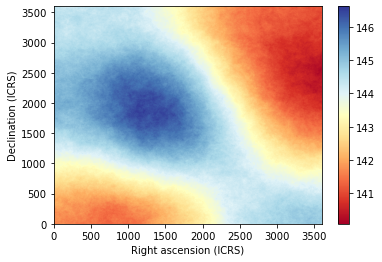

2022-08-13 13:35:37,369 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:35:37,370 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 193.60 [MHz] ...
2022-08-13 13:35:38,449 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:35:39,652 : simulate_frequency : INFO : Done simulate map at 193.60 [MHz].
2022-08-13 13:35:39,739 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_193.60.fits']


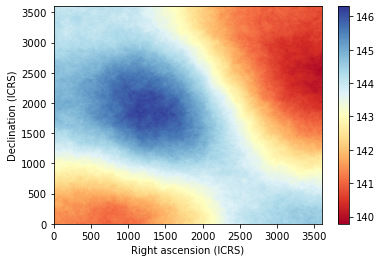

2022-08-13 13:35:41,012 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:35:41,013 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 193.76 [MHz] ...
2022-08-13 13:35:42,091 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:35:43,346 : simulate_frequency : INFO : Done simulate map at 193.76 [MHz].
2022-08-13 13:35:43,432 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_193.76.fits']


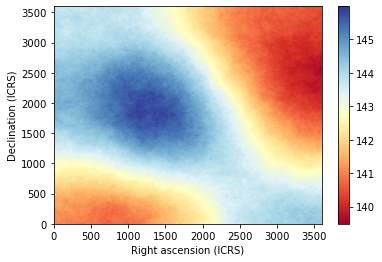

2022-08-13 13:35:44,700 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:35:44,702 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 193.92 [MHz] ...
2022-08-13 13:35:45,780 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:35:47,086 : simulate_frequency : INFO : Done simulate map at 193.92 [MHz].
2022-08-13 13:35:47,173 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_193.92.fits']


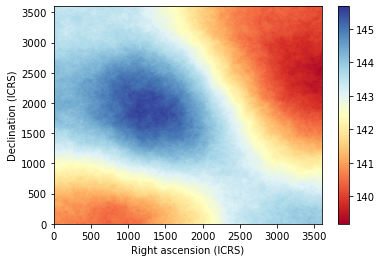

2022-08-13 13:35:48,443 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:35:48,444 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 194.08 [MHz] ...
2022-08-13 13:35:49,521 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:35:50,829 : simulate_frequency : INFO : Done simulate map at 194.08 [MHz].
2022-08-13 13:35:50,916 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_194.08.fits']


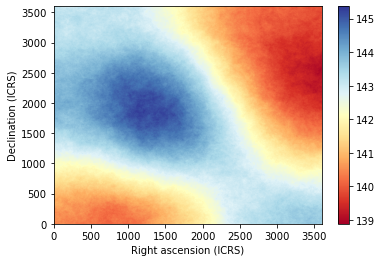

2022-08-13 13:35:52,189 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:35:52,191 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 194.24 [MHz] ...
2022-08-13 13:35:53,269 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:35:54,575 : simulate_frequency : INFO : Done simulate map at 194.24 [MHz].
2022-08-13 13:35:54,662 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_194.24.fits']


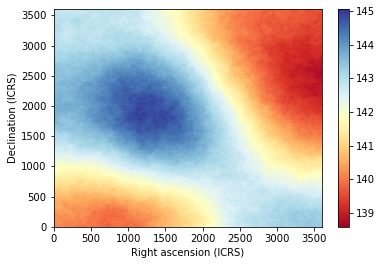

2022-08-13 13:35:55,933 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:35:55,935 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 194.40 [MHz] ...
2022-08-13 13:35:57,012 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:35:58,319 : simulate_frequency : INFO : Done simulate map at 194.40 [MHz].
2022-08-13 13:35:58,407 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_194.40.fits']


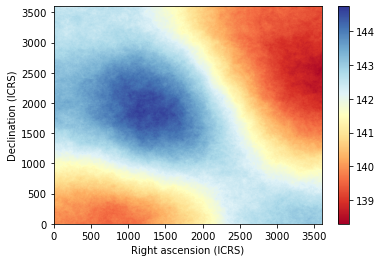

2022-08-13 13:35:59,673 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:35:59,675 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 194.56 [MHz] ...
2022-08-13 13:36:00,753 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:36:02,061 : simulate_frequency : INFO : Done simulate map at 194.56 [MHz].
2022-08-13 13:36:02,148 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_194.56.fits']


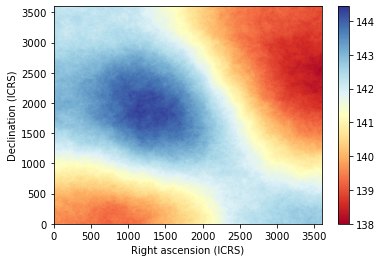

2022-08-13 13:36:03,861 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:36:03,863 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 194.72 [MHz] ...
2022-08-13 13:36:04,942 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:36:06,144 : simulate_frequency : INFO : Done simulate map at 194.72 [MHz].
2022-08-13 13:36:06,231 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_194.72.fits']


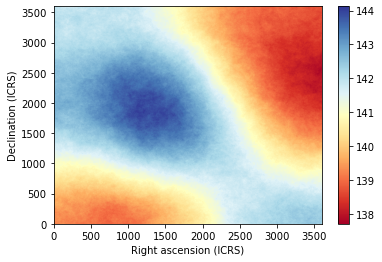

2022-08-13 13:36:07,505 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:36:07,507 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 194.88 [MHz] ...
2022-08-13 13:36:08,587 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:36:09,790 : simulate_frequency : INFO : Done simulate map at 194.88 [MHz].
2022-08-13 13:36:09,877 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_194.88.fits']


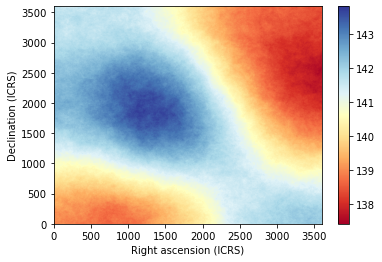

2022-08-13 13:36:11,151 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:36:11,154 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 195.04 [MHz] ...
2022-08-13 13:36:12,233 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:36:13,434 : simulate_frequency : INFO : Done simulate map at 195.04 [MHz].
2022-08-13 13:36:13,521 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_195.04.fits']


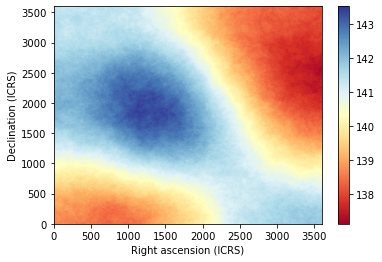

2022-08-13 13:36:14,792 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:36:14,794 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 195.20 [MHz] ...
2022-08-13 13:36:15,872 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:36:17,076 : simulate_frequency : INFO : Done simulate map at 195.20 [MHz].
2022-08-13 13:36:17,164 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_195.20.fits']


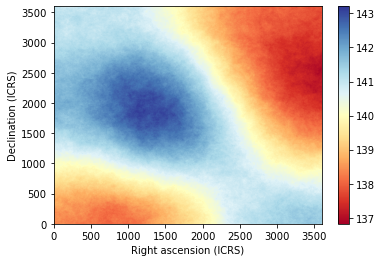

2022-08-13 13:36:18,440 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:36:18,442 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 195.36 [MHz] ...
2022-08-13 13:36:19,521 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:36:20,726 : simulate_frequency : INFO : Done simulate map at 195.36 [MHz].
2022-08-13 13:36:20,813 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_195.36.fits']


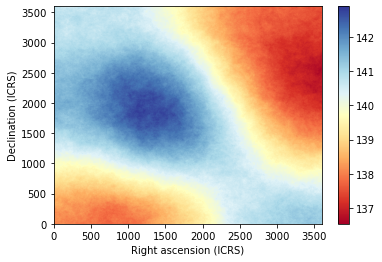

2022-08-13 13:36:22,080 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:36:22,082 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 195.52 [MHz] ...
2022-08-13 13:36:23,160 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:36:24,417 : simulate_frequency : INFO : Done simulate map at 195.52 [MHz].
2022-08-13 13:36:24,504 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_195.52.fits']


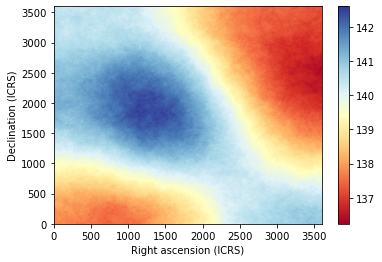

2022-08-13 13:36:25,772 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:36:25,774 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 195.68 [MHz] ...
2022-08-13 13:36:26,853 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:36:28,160 : simulate_frequency : INFO : Done simulate map at 195.68 [MHz].
2022-08-13 13:36:28,247 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_195.68.fits']


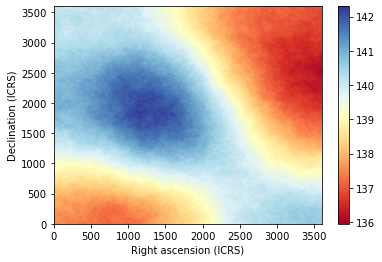

2022-08-13 13:36:29,520 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:36:29,522 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 195.84 [MHz] ...
2022-08-13 13:36:30,600 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:36:31,910 : simulate_frequency : INFO : Done simulate map at 195.84 [MHz].
2022-08-13 13:36:31,998 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_195.84.fits']


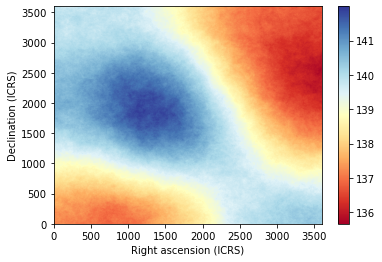

2022-08-13 13:36:33,266 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:36:33,268 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 196.00 [MHz] ...
2022-08-13 13:36:34,346 : add_ss : INFO : The small scale map is generated using alpha=0.0342225044016289, beta=0.2268036829295495.
2022-08-13 13:36:35,654 : simulate_frequency : INFO : Done simulate map at 196.00 [MHz].
2022-08-13 13:36:35,742 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_196.00.fits']


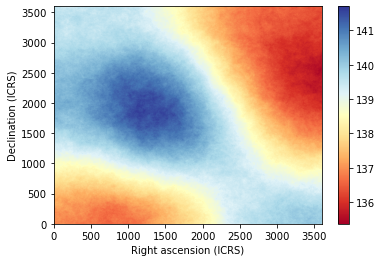

In [27]:
do_simulation(Sfov2.freqs['hig']['f'], Sfov2, fov2_outhig)

In [28]:
tt = fits.open('/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196/gsync_fov2_0-27_188.00.fits')